<a href="https://colab.research.google.com/github/DilaAyuPrastita/Real-Time-Object-Color-Detection/blob/main/CNN_Xception_Tugas_Akhir.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **LOAD DATASET**

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Path ke folder dataset
dataset_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82'

# Fungsi untuk membaca isi folder
def get_dataset_info(folder_path):
    filepaths = []
    labels = []
    classlist = os.listdir(folder_path)  # List semua kelas dalam folder
    for klass in classlist:
        classpath = os.path.join(folder_path, klass)
        if os.path.isdir(classpath):
            flist = os.listdir(classpath)  # List semua file dalam subfolder kelas
            for f in flist:
                fpath = os.path.join(classpath, f)
                filepaths.append(fpath)
                labels.append(klass)
    return filepaths, labels

# Mendapatkan informasi dari folder train
train_folder = os.path.join(dataset_path, 'train')
train_filepaths, train_labels = get_dataset_info(train_folder)
train_df = pd.DataFrame({'filepaths': train_filepaths, 'labels': train_labels})

# Mendapatkan informasi dari folder test
test_folder = os.path.join(dataset_path, 'test')
test_filepaths, test_labels = get_dataset_info(test_folder)
test_df = pd.DataFrame({'filepaths': test_filepaths, 'labels': test_labels})

# Menampilkan isi dataset
print("Train Dataset Info:")
print(train_df.head())
print(train_df['labels'].value_counts())  # Jumlah data per kelas di train

print("\nTest Dataset Info:")
print(test_df.head())
print(test_df['labels'].value_counts())  # Jumlah data per kelas di test

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train Dataset Info:
                                           filepaths  labels
0  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
1  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
2  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
3  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
4  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
labels
Red       800
Green     800
Blue      800
Yellow    507
Name: count, dtype: int64

Test Dataset Info:
                                           filepaths  labels
0  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
1  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
2  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
3  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
4  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
labels
Red

Found 2907 images belonging to 4 classes.
Found 726 images belonging to 4 classes.
Menampilkan sampel dari dataset train:


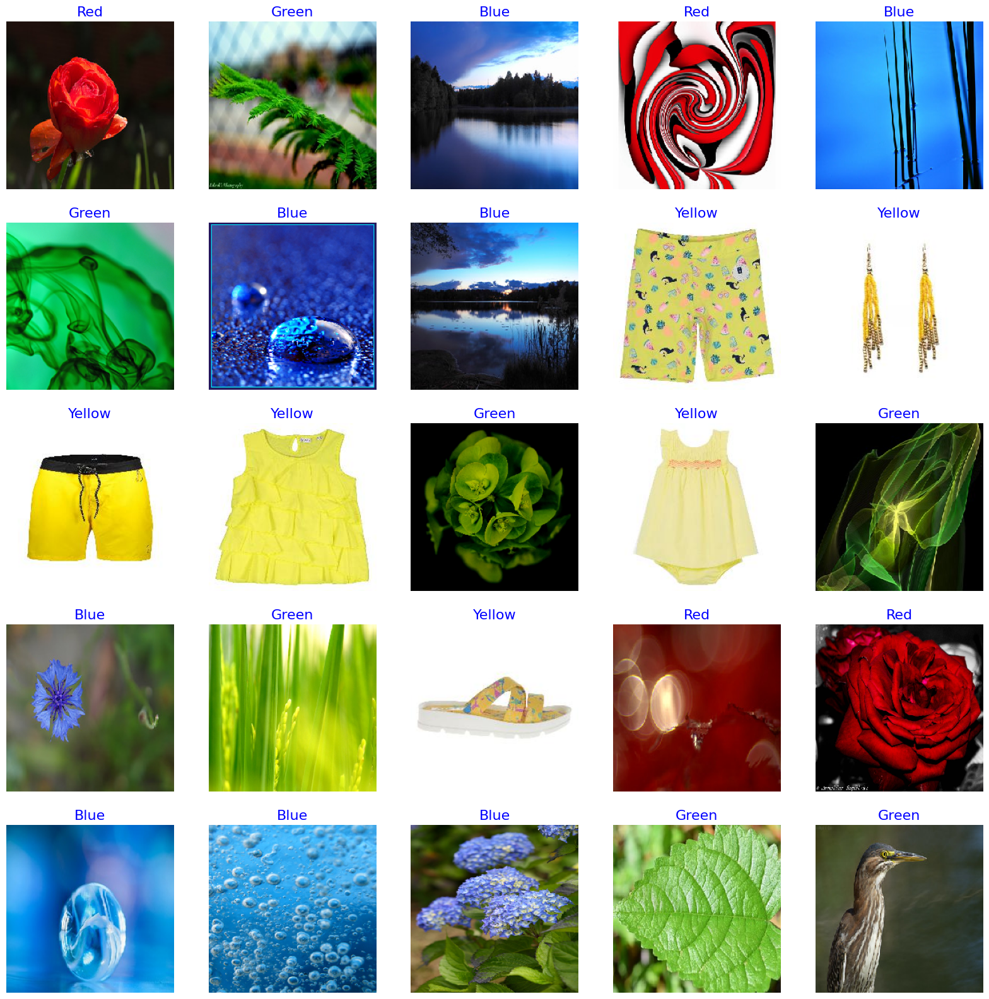

Menampilkan sampel dari dataset test:


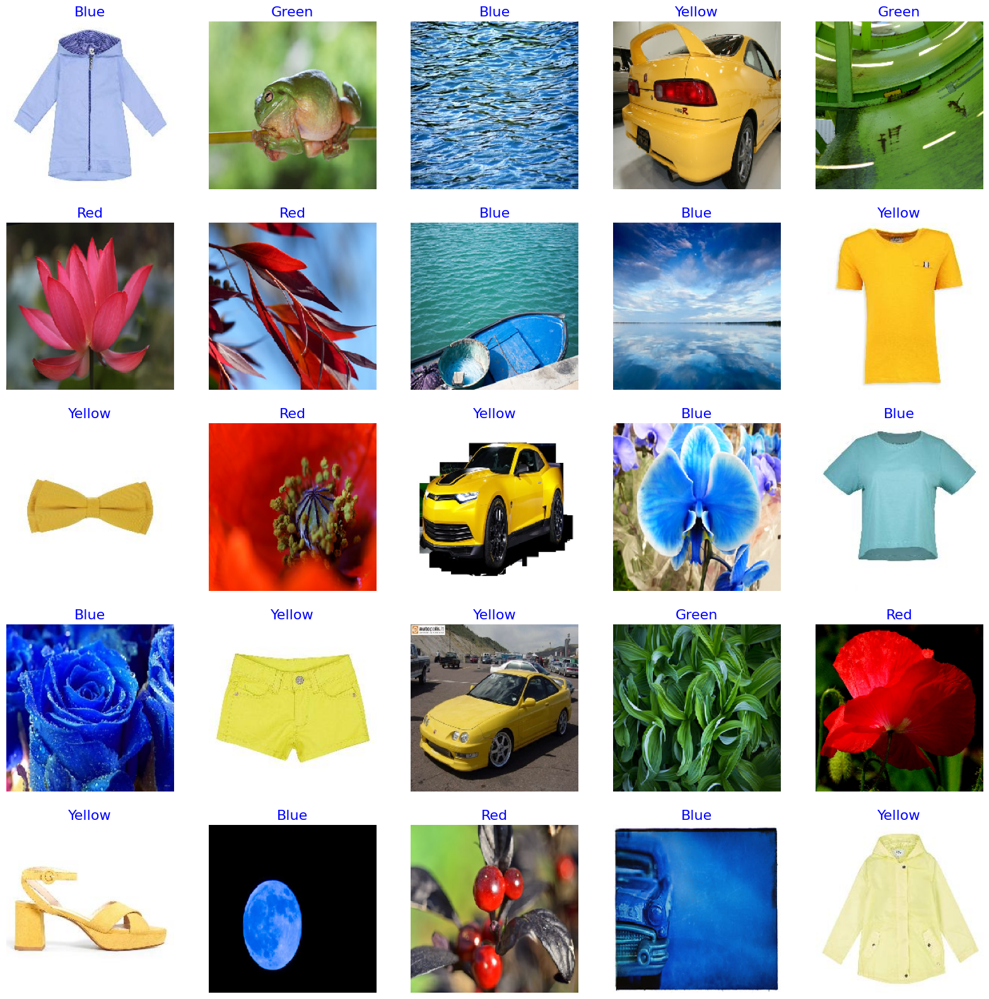

In [ ]:
# Fungsi untuk menampilkan sampel gambar beserta labelnya
def show_image_samples(gen, label_colors):

    test_dict = gen.class_indices  # Mendapatkan indeks kelas dari generator
    classes = list(test_dict.keys())  # Mendapatkan nama-nama kelas
    images, labels = next(gen)  # Mendapatkan batch gambar dan label dari generator
    plt.figure(figsize=(20, 20))

    # Tentukan jumlah gambar yang akan ditampilkan (maksimal 25)
    length = len(labels)
    r = min(length, 25)  # Batas maksimal adalah 25 gambar

    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i]
        plt.imshow(image)  # Menampilkan gambar

        # Mendapatkan indeks kelas dan nama warna
        index = np.argmax(labels[i])
        class_name = classes[index]
        color_name = label_colors.get(class_name, class_name)  # Nama warna dari label

        plt.title(color_name, color='blue', fontsize=16)
        plt.axis('off')
    plt.show()

# Contoh pemetaan label ke warna
label_colors = {
    'red': 'Merah',
    'blue': 'Biru',
    'green': 'Hijau',
    'yellow': 'Kuning',
}

# Konfigurasi ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255)

# Membuat generator untuk folder train
train_gen = datagen.flow_from_directory(
    '/content/drive/My Drive/tugas_akhir/dataset_fix82/train',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Membuat generator untuk folder test
test_gen = datagen.flow_from_directory(
    '/content/drive/My Drive/tugas_akhir/dataset_fix82/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Menampilkan sampel gambar dari folder train
print("Menampilkan sampel dari dataset train:")
show_image_samples(train_gen, label_colors)

# Menampilkan sampel gambar dari folder test
print("Menampilkan sampel dari dataset test:")
show_image_samples(test_gen, label_colors)

# **PREPROCESSING**

**1. Resize Gambar**

In [ ]:
dataset_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82'
target_size = (128, 128)  # Define your desired target size

def resize_images_inplace(folder_path):
    for subdir, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(subdir, file)
                img = cv2.imread(img_path)
                if img is not None:  # Check if the image was loaded successfully
                    resized_img = cv2.resize(img, target_size)
                    cv2.imwrite(img_path, resized_img)  # Overwrite the original image
                else:
                    print(f"Error loading image: {img_path}")

# Resize images in the train and test folders
train_folder = os.path.join(dataset_path, 'train')
resize_images_inplace(train_folder)

test_folder = os.path.join(dataset_path, 'test')
resize_images_inplace(test_folder)

print("Resizing complete!")

Resizing complete!


Mounted at /content/drive


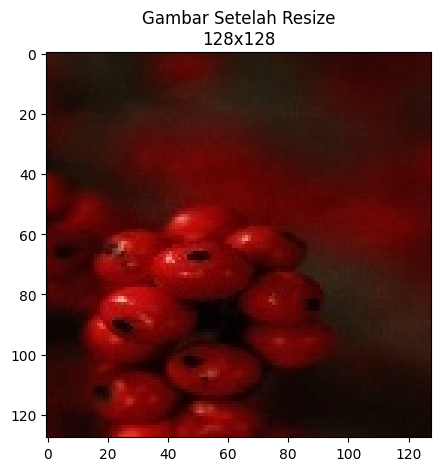

In [2]:
# Mount Google Drive
drive.mount('/content/drive')

# Path ke gambar
image_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train/Red/Red11.jpg'

# Baca gambar asli
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Konversi ke RGB untuk Matplotlib

# Resize gambar
target_size = (128, 128)  # (width, height)
resized_img = cv2.resize(original_img, target_size)
resized_size = resized_img.shape[:2]  # (height, width)

# Tampilkan hanya gambar hasil resize dengan sumbu
plt.figure(figsize=(5, 5))
plt.imshow(resized_img)
plt.title(f"Gambar Setelah Resize\n{resized_size[1]}x{resized_size[0]}")
plt.show()

**2. Augmentasi Gambar**

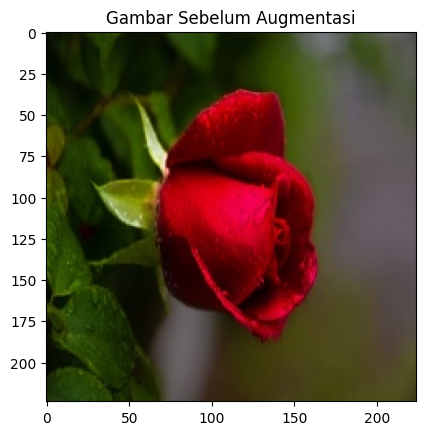

In [ ]:
# Path ke gambar
image_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train/Red/Red114.jpg'

# Baca gambar
img = cv2.imread(image_path)

# Ubah BGR ke RGB (karena Matplotlib menggunakan RGB)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Tampilkan gambar
plt.imshow(img)
plt.axis('on') # Tampilkan sumbu
plt.title(f"Gambar Sebelum Augmentasi")
plt.show()

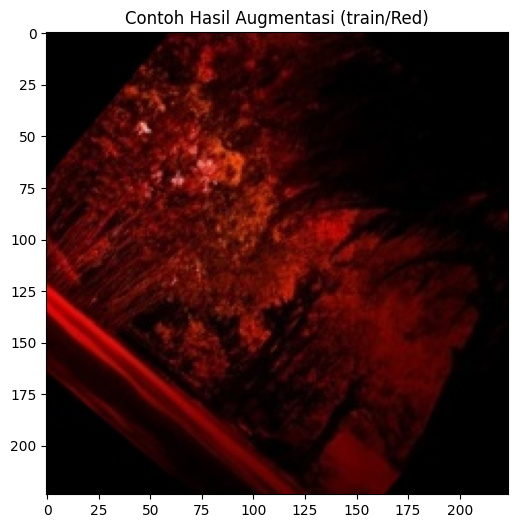

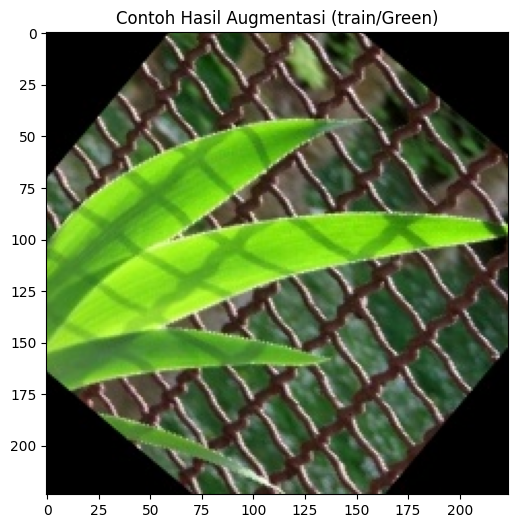

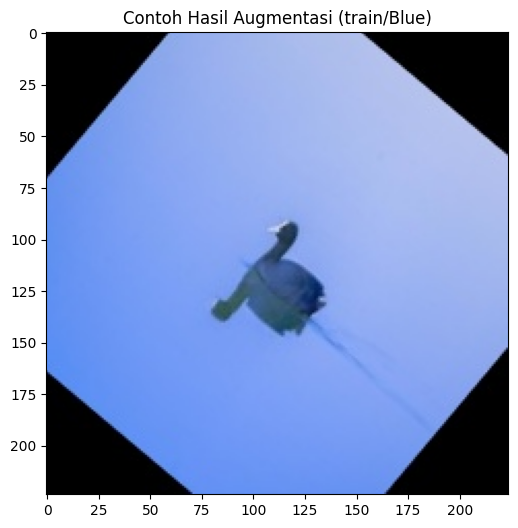

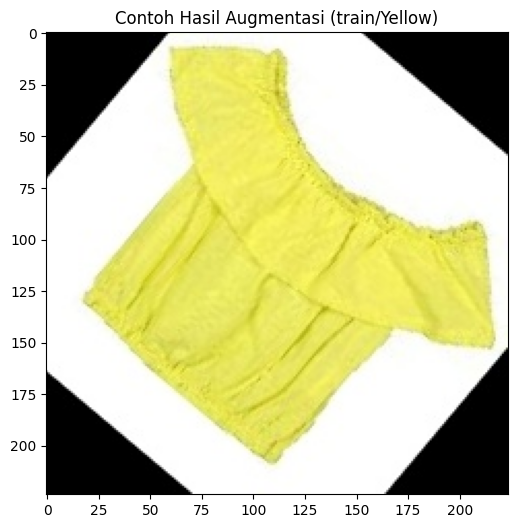

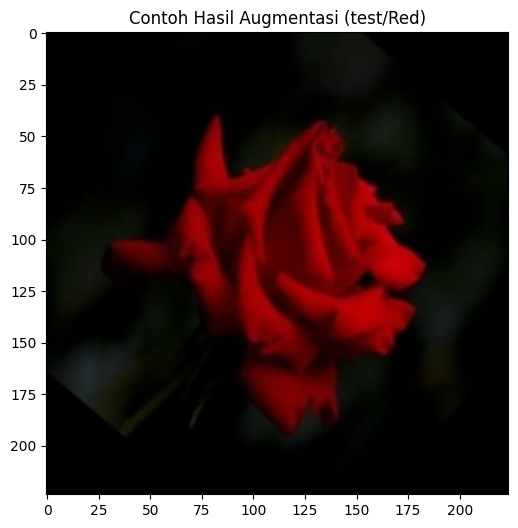

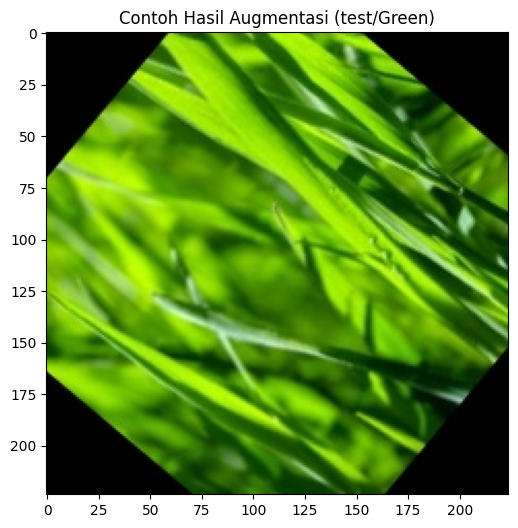

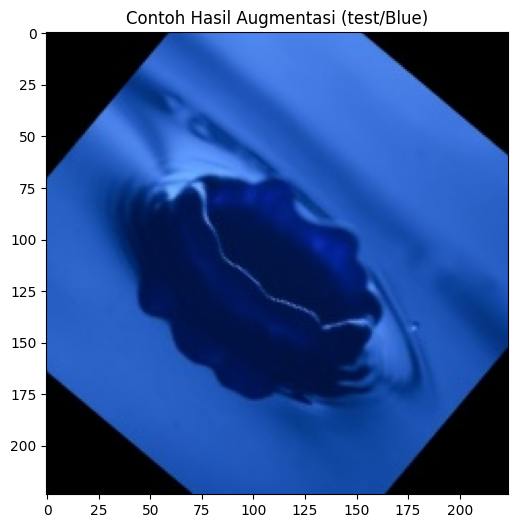

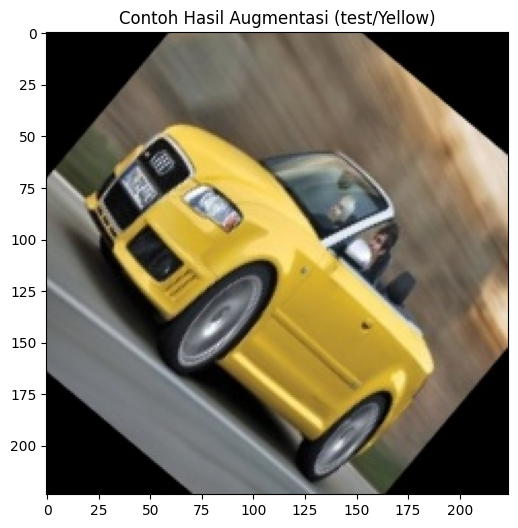

In [ ]:
import imgaug.augmenters as iaa
import random

def augment_dataset(dataset_root):
    classes = ['Red', 'Green', 'Blue', 'Yellow']  # Kelas dalam dataset

    for dataset_type in ['train', 'test']:  # Augmentasi untuk train dan test
        dataset_path = os.path.join(dataset_root, dataset_type)

        if not os.path.exists(dataset_path):
            print(f"Error: Folder '{dataset_path}' tidak ditemukan!")
            continue

        for class_name in classes:
            class_path = os.path.join(dataset_path, class_name)

            if not os.path.exists(class_path):
                print(f"Warning: Kelas '{class_name}' tidak ditemukan di {dataset_type}, dilewati.")
                continue

            image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

            if not image_files:
                print(f"Tidak ada gambar dalam kelas '{class_name}' di {dataset_type}.")
                continue

            augmented_files = []  # Simpan path gambar hasil augmentasi untuk ditampilkan nanti

            for img_name in image_files:
                img_path = os.path.join(class_path, img_name)

                # Baca gambar asli
                original_img = cv2.imread(img_path)
                if original_img is None:
                    print(f"Error: Tidak dapat membaca gambar {img_name}")
                    continue

                original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
                img_base, img_ext = os.path.splitext(img_name)

                # Konversi ke format array NumPy
                img_array = np.array(original_img)

                # Augmentasi
                rotate_augment = iaa.Affine(rotate=40)  # Rotasi 40°
                hflip_augment = iaa.Fliplr(1.0)         # Flip Horizontal
                vflip_augment = iaa.Flipud(1.0)         # Flip Vertikal

                # Terapkan augmentasi
                rotated_img = rotate_augment(image=img_array)
                hflip_img = hflip_augment(image=img_array)
                vflip_img = vflip_augment(image=img_array)

                # Simpan hasil augmentasi ke folder kelas yang sama
                rotated_path = os.path.join(class_path, f"{img_base}_rotated40{img_ext}")
                hflip_path = os.path.join(class_path, f"{img_base}_hflip{img_ext}")
                vflip_path = os.path.join(class_path, f"{img_base}_vflip{img_ext}")

                cv2.imwrite(rotated_path, cv2.cvtColor(rotated_img, cv2.COLOR_RGB2BGR))
                cv2.imwrite(hflip_path, cv2.cvtColor(hflip_img, cv2.COLOR_RGB2BGR))
                cv2.imwrite(vflip_path, cv2.cvtColor(vflip_img, cv2.COLOR_RGB2BGR))

                augmented_files.append(rotated_path)  # Simpan salah satu untuk ditampilkan

            # Pilih satu gambar hasil augmentasi untuk ditampilkan sebagai contoh
            if augmented_files:
                sample_path = random.choice(augmented_files)
                sample_img = cv2.imread(sample_path)
                sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

                plt.figure(figsize=(6, 6))
                plt.imshow(sample_img)
                plt.title(f"Contoh Hasil Augmentasi ({dataset_type}/{class_name})")
                plt.axis("on")
                plt.show()

# Contoh penggunaan: terapkan augmentasi ke seluruh dataset (train & test)
dataset_root = "/content/drive/My Drive/tugas_akhir/dataset_fix82"
augment_dataset(dataset_root)

Mounted at /content/drive


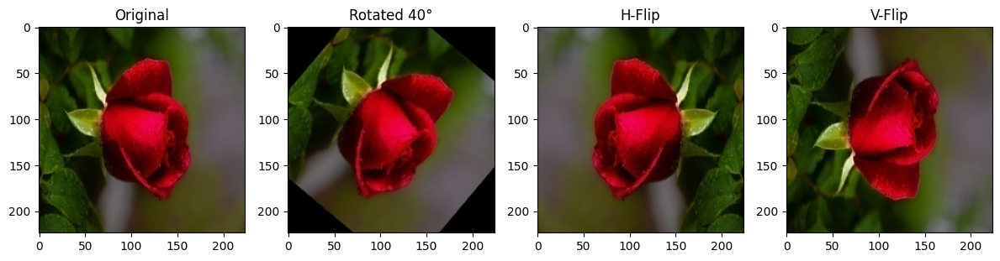

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Path gambar asli
image_path = "/content/drive/My Drive/tugas_akhir/dataset_fix82/train/Red/Red114.jpg"

# Cek apakah file ada
if not os.path.exists(image_path):
    print(f"Error: File tidak ditemukan di {image_path}")
else:
    # Baca gambar asli
    original_img = cv2.imread(image_path)
    if original_img is None:
        print(f"Error: Gagal membaca gambar asli di {image_path}")
    else:
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # Path untuk hasil augmentasi
        base_name = os.path.splitext(os.path.basename(image_path))[0]  # "Red114"
        folder_path = os.path.dirname(image_path)  # Folder kelas Red

        rotated_path = os.path.join(folder_path, f"{base_name}_rotated40.jpg")
        hflip_path = os.path.join(folder_path, f"{base_name}_hflip.jpg")
        vflip_path = os.path.join(folder_path, f"{base_name}_vflip.jpg")

        # Baca hasil augmentasi
        augmented_images = {}
        for aug_name, path in zip(["rotated", "hflip", "vflip"], [rotated_path, hflip_path, vflip_path]):
            if os.path.exists(path):
                img = cv2.imread(path)
                if img is not None:
                    augmented_images[aug_name] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                else:
                    print(f"Error: Gagal membaca {aug_name} di {path}")
            else:
                print(f"Error: File {aug_name} tidak ditemukan di {path}")

        # Tampilkan gambar jika semua ada
        if len(augmented_images) == 3:
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 4, 1)
            plt.imshow(original_img)
            plt.title("Original")

            plt.subplot(1, 4, 2)
            plt.imshow(augmented_images["rotated"])
            plt.title("Rotated 40°")

            plt.subplot(1, 4, 3)
            plt.imshow(augmented_images["hflip"])
            plt.title("H-Flip")

            plt.subplot(1, 4, 4)
            plt.imshow(augmented_images["vflip"])
            plt.title("V-Flip")

            plt.tight_layout()
            plt.show()
        else:
            print("Gagal menampilkan gambar. Periksa kembali hasil augmentasi.")

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Path ke folder dataset
dataset_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82'

# Fungsi untuk membaca isi folder
def get_dataset_info(folder_path):
    filepaths = []
    labels = []
    classlist = os.listdir(folder_path)  # List semua kelas dalam folder
    for klass in classlist:
        classpath = os.path.join(folder_path, klass)
        if os.path.isdir(classpath):
            flist = os.listdir(classpath)  # List semua file dalam subfolder kelas
            for f in flist:
                fpath = os.path.join(classpath, f)
                filepaths.append(fpath)
                labels.append(klass)
    return filepaths, labels

# Mendapatkan informasi dari folder train
train_folder = os.path.join(dataset_path, 'train')
train_filepaths, train_labels = get_dataset_info(train_folder)
train_df = pd.DataFrame({'filepaths': train_filepaths, 'labels': train_labels})

# Mendapatkan informasi dari folder test
test_folder = os.path.join(dataset_path, 'test')
test_filepaths, test_labels = get_dataset_info(test_folder)
test_df = pd.DataFrame({'filepaths': test_filepaths, 'labels': test_labels})

# Menampilkan isi dataset
print("Train Dataset Info:")
print(train_df.head())
print(train_df['labels'].value_counts())  # Jumlah data per kelas di train

print("\nTest Dataset Info:")
print(test_df.head())
print(test_df['labels'].value_counts())  # Jumlah data per kelas di test

Mounted at /content/drive
Train Dataset Info:
                                           filepaths labels
0  /content/drive/My Drive/tugas_akhir/dataset_fi...    Red
1  /content/drive/My Drive/tugas_akhir/dataset_fi...    Red
2  /content/drive/My Drive/tugas_akhir/dataset_fi...    Red
3  /content/drive/My Drive/tugas_akhir/dataset_fi...    Red
4  /content/drive/My Drive/tugas_akhir/dataset_fi...    Red
labels
Red       3200
Blue      3200
Green     3200
Yellow    2028
Name: count, dtype: int64

Test Dataset Info:
                                           filepaths  labels
0  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
1  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
2  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
3  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
4  /content/drive/My Drive/tugas_akhir/dataset_fi...  Yellow
labels
Blue      800
Green     800
Red       800
Yellow    504
Name: count, dtype: int64


**3. Normalisasi Gambar**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path dataset utama
dataset_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82'

# Normalisasi (membagi nilai pixel dengan 255)
datagen = ImageDataGenerator(rescale=1./255)

# Membaca dataset
generator = datagen.flow_from_directory(
    dataset_path,
    class_mode='categorical',  # Format label (one-hot encoding)
    shuffle=True  # Acak urutan data
)

Found 14532 images belonging to 2 classes.


In [ ]:
# Path to a sample image (replace with your actual image path)
sample_image_path = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train/Red/Red1_hflip.jpg'

# Load the image
img = cv2.imread(sample_image_path)

if img is not None:
    # Display original image pixel values
    print("Original Image Pixel Values:")
    print(img)

    # Normalize the image
    img_normalized = img / 255.0

    # Display normalized image pixel values
    print("\nNormalized Image Pixel Values:")
    print(img_normalized)
else:
    print(f"Error: Could not read image at {sample_image_path}")


Original Image Pixel Values:
[[[28 44 61]
  [28 44 61]
  [33 44 64]
  ...
  [29 43 62]
  [29 42 64]
  [30 43 65]]

 [[28 42 60]
  [28 42 60]
  [30 44 63]
  ...
  [29 43 62]
  [29 42 64]
  [29 42 64]]

 [[31 43 61]
  [28 42 60]
  [30 44 63]
  ...
  [28 42 61]
  [28 41 63]
  [29 42 64]]

 ...

 [[29 43 62]
  [29 43 62]
  [29 43 62]
  ...
  [28 42 61]
  [29 43 62]
  [29 43 62]]

 [[28 42 61]
  [28 42 61]
  [28 42 61]
  ...
  [28 42 61]
  [29 43 62]
  [29 43 62]]

 [[28 42 61]
  [28 42 61]
  [28 42 61]
  ...
  [28 42 61]
  [28 42 61]
  [29 43 62]]]

Normalized Image Pixel Values:
[[[0.10980392 0.17254902 0.23921569]
  [0.10980392 0.17254902 0.23921569]
  [0.12941176 0.17254902 0.25098039]
  ...
  [0.11372549 0.16862745 0.24313725]
  [0.11372549 0.16470588 0.25098039]
  [0.11764706 0.16862745 0.25490196]]

 [[0.10980392 0.16470588 0.23529412]
  [0.10980392 0.16470588 0.23529412]
  [0.11764706 0.17254902 0.24705882]
  ...
  [0.11372549 0.16862745 0.24313725]
  [0.11372549 0.16470588 0.250980

# **MODEL Xception**

# **Xception Variasi 1**

- Optimizer = Adam
- Batch Size = 32
- Learning Rate = 0,001

**Bangun Model**

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from google.colab import drive
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras import layers, models
import time

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar1 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar1.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar1.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 31, 31,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add[0][0]       

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


363/363 ━━━━━━━━━━━━━━━━━━━━ 3169s 9s/step - accuracy: 0.7393 - loss: 0.6913
Epoch 2/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 8s 107us/step - accuracy: 0.9062 - loss: 0.2725
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


363/363 ━━━━━━━━━━━━━━━━━━━━ 848s 2s/step - accuracy: 0.9014 - loss: 0.3020
Epoch 4/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 87us/step - accuracy: 0.8125 - loss: 0.5540 
Epoch 5/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 847s 2s/step - accuracy: 0.9220 - loss: 0.2333
Epoch 6/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 47us/step - accuracy: 0.9688 - loss: 0.1429 
Epoch 7/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 842s 2s/step - accuracy: 0.9362 - loss: 0.1918
Epoch 8/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 39us/step - accuracy: 0.9062 - loss: 0.1316 
Epoch 9/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 799s 2s/step - accuracy: 0.9397 - loss: 0.1610
Epoch 10/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 46us/step - accuracy: 0.8750 - loss: 0.2264 
Training Time: 6548.12 seconds
90/90 ━━━━━━━━━━━━━━━━━━━━ 1125s 13s/step - accuracy: 0.8646 - loss: 0.3951
Test Loss: 0.44203418493270874
Test Accuracy: 0.8572916388511658


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 128, 128, 3))
  warnings.warn(msg)


91/91 ━━━━━━━━━━━━━━━━━━━━ 204s 2s/step
Prediction Time: 204.28 seconds


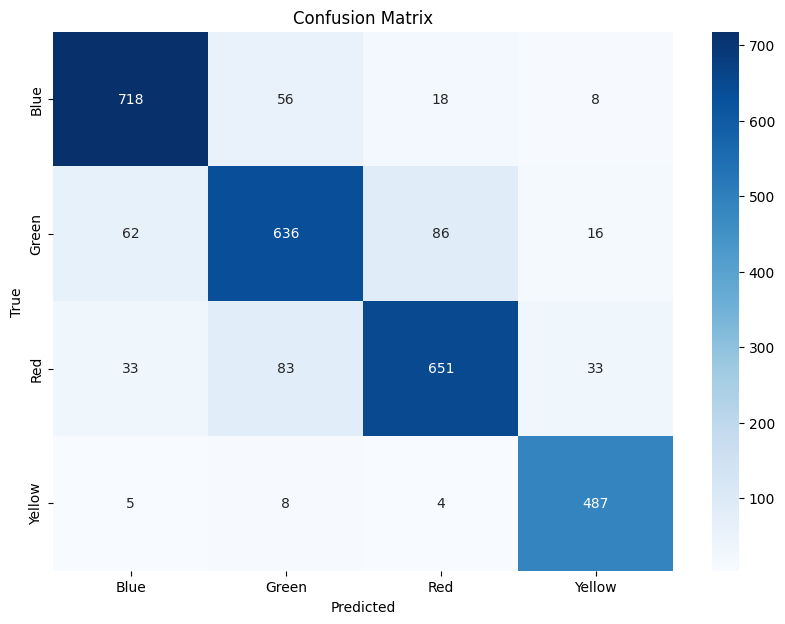


Classification Report:

              precision    recall  f1-score   support

        Blue       0.88      0.90      0.89       800
       Green       0.81      0.80      0.80       800
         Red       0.86      0.81      0.84       800
      Yellow       0.90      0.97      0.93       504

    accuracy                           0.86      2904
   macro avg       0.86      0.87      0.86      2904
weighted avg       0.86      0.86      0.86      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=32,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar1.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar1.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar1.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar1.save('/content/drive/My Drive/tugas_akhir/model_xception_var1_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar1.save('/content/drive/My Drive/tugas_akhir/model_xception_var1_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 2**

- Optimizer = Adam
- Batch Size = 64
- Learning Rate = 0,001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar2 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar2.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar2.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer_1[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add_12[0][0]    

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_136']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


181/181 ━━━━━━━━━━━━━━━━━━━━ 921s 5s/step - accuracy: 0.7317 - loss: 0.7097
Epoch 2/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 105us/step - accuracy: 0.8750 - loss: 0.5277
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


181/181 ━━━━━━━━━━━━━━━━━━━━ 878s 5s/step - accuracy: 0.9040 - loss: 0.2963
Epoch 4/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 91us/step - accuracy: 0.8906 - loss: 0.2378 
Epoch 5/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 905s 5s/step - accuracy: 0.9267 - loss: 0.2194
Epoch 6/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 143us/step - accuracy: 0.9375 - loss: 0.2576
Epoch 7/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 854s 5s/step - accuracy: 0.9434 - loss: 0.1790
Epoch 8/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 114us/step - accuracy: 0.9375 - loss: 0.2373
Epoch 9/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 857s 5s/step - accuracy: 0.9486 - loss: 0.1445
Epoch 10/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 81us/step - accuracy: 1.0000 - loss: 0.0628 
Training Time: 4435.99 seconds
45/45 ━━━━━━━━━━━━━━━━━━━━ 214s 5s/step - accuracy: 0.8630 - loss: 0.4093
Test Loss: 0.4313713610172272
Test Accuracy: 0.8614583611488342


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_136']
Received: inputs=Tensor(shape=(64, 128, 128, 3))
  warnings.warn(msg)


46/46 ━━━━━━━━━━━━━━━━━━━━ 216s 5s/step
Prediction Time: 262.57 seconds


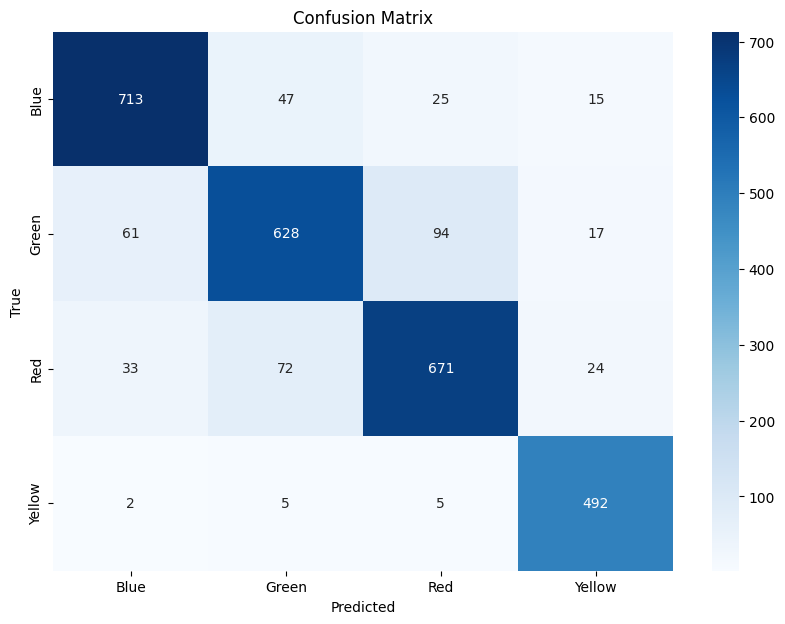


Classification Report:

              precision    recall  f1-score   support

        Blue       0.88      0.89      0.89       800
       Green       0.84      0.79      0.81       800
         Red       0.84      0.84      0.84       800
      Yellow       0.90      0.98      0.94       504

    accuracy                           0.86      2904
   macro avg       0.86      0.87      0.87      2904
weighted avg       0.86      0.86      0.86      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=64,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=64,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar2.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar2.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar2.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar2.save('/content/drive/My Drive/tugas_akhir/model_xception_var2_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar2.save('/content/drive/My Drive/tugas_akhir/model_xception_var2_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 3**

- Optimizer = Adam
- Batch Size = 32
- Learning Rate = 0,0001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar3 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar3.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar3.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer_2[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │        512 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_24 (Add)        │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add_24[0][0]    

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


363/363 ━━━━━━━━━━━━━━━━━━━━ 872s 2s/step - accuracy: 0.5636 - loss: 1.0333
Epoch 2/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 125us/step - accuracy: 0.7812 - loss: 0.7457
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


363/363 ━━━━━━━━━━━━━━━━━━━━ 807s 2s/step - accuracy: 0.8308 - loss: 0.5013
Epoch 4/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 116us/step - accuracy: 0.8750 - loss: 0.4549
Epoch 5/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 864s 2s/step - accuracy: 0.8705 - loss: 0.3955
Epoch 6/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 67us/step - accuracy: 0.9375 - loss: 0.2163 
Epoch 7/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 839s 2s/step - accuracy: 0.8905 - loss: 0.3351
Epoch 8/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 75us/step - accuracy: 1.0000 - loss: 0.1286 
Epoch 9/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 815s 2s/step - accuracy: 0.9064 - loss: 0.2840
Epoch 10/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 76us/step - accuracy: 0.9062 - loss: 0.2528 
Training Time: 4269.88 seconds
90/90 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.8618 - loss: 0.3926
Test Loss: 0.39927801489830017
Test Accuracy: 0.8565972447395325


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(32, 128, 128, 3))
  warnings.warn(msg)


91/91 ━━━━━━━━━━━━━━━━━━━━ 202s 2s/step
Prediction Time: 202.60 seconds


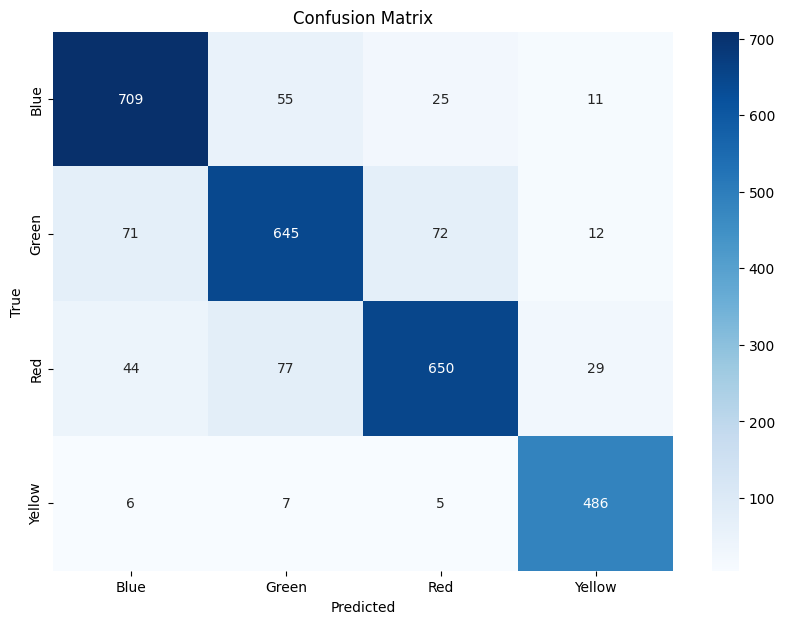


Classification Report:

              precision    recall  f1-score   support

        Blue       0.85      0.89      0.87       800
       Green       0.82      0.81      0.81       800
         Red       0.86      0.81      0.84       800
      Yellow       0.90      0.96      0.93       504

    accuracy                           0.86      2904
   macro avg       0.86      0.87      0.86      2904
weighted avg       0.86      0.86      0.86      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=32,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar3.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar3.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar3.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar3.save('/content/drive/My Drive/tugas_akhir/model_xception_var3_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar3.save('/content/drive/My Drive/tugas_akhir/model_xception_var3_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 4**

- Optimizer = Adam
- Batch Size = 64
- Learning Rate = 0,0001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar4 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar4.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar4.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 31, 31,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add[0][0]       

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


181/181 ━━━━━━━━━━━━━━━━━━━━ 2020s 11s/step - accuracy: 0.4891 - loss: 1.1768
Epoch 2/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 11s 76us/step - accuracy: 0.8281 - loss: 0.7154 
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


181/181 ━━━━━━━━━━━━━━━━━━━━ 897s 5s/step - accuracy: 0.7998 - loss: 0.5872
Epoch 4/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 6s 123us/step - accuracy: 0.8125 - loss: 0.5047
Epoch 5/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 905s 5s/step - accuracy: 0.8510 - loss: 0.4568
Epoch 6/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 6s 91us/step - accuracy: 0.8594 - loss: 0.4169 
Epoch 7/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 925s 5s/step - accuracy: 0.8683 - loss: 0.3975
Epoch 8/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 157us/step - accuracy: 0.8594 - loss: 0.4102
Epoch 9/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 912s 5s/step - accuracy: 0.8876 - loss: 0.3544
Epoch 10/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 89us/step - accuracy: 0.8906 - loss: 0.3153 
Training Time: 5797.70 seconds
45/45 ━━━━━━━━━━━━━━━━━━━━ 683s 15s/step - accuracy: 0.8507 - loss: 0.4111
Test Loss: 0.4162469208240509
Test Accuracy: 0.8524305820465088


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(64, 128, 128, 3))
  warnings.warn(msg)


46/46 ━━━━━━━━━━━━━━━━━━━━ 225s 5s/step
Prediction Time: 225.40 seconds


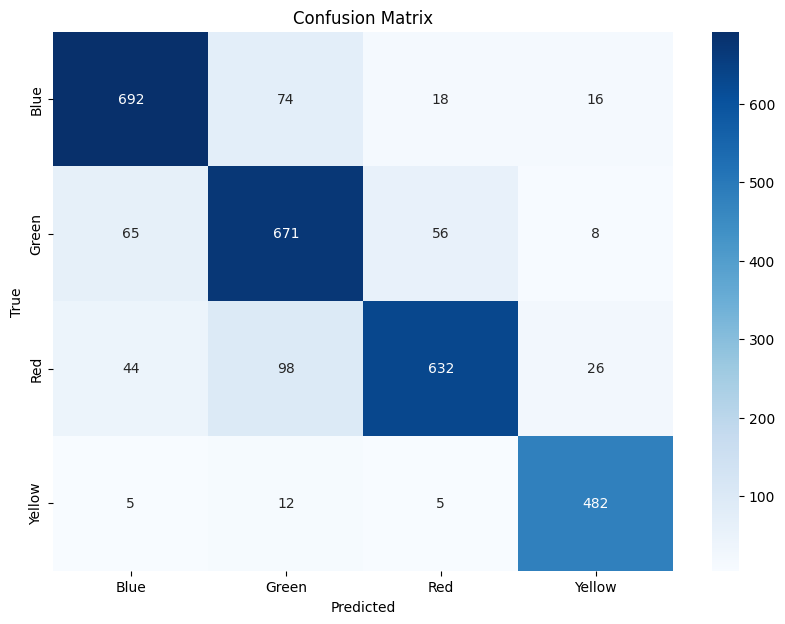


Classification Report:

              precision    recall  f1-score   support

        Blue       0.86      0.86      0.86       800
       Green       0.78      0.84      0.81       800
         Red       0.89      0.79      0.84       800
      Yellow       0.91      0.96      0.93       504

    accuracy                           0.85      2904
   macro avg       0.86      0.86      0.86      2904
weighted avg       0.85      0.85      0.85      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=64,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=64,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar4.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar4.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar4.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar4.save('/content/drive/My Drive/tugas_akhir/model_xception_var4_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar4.save('/content/drive/My Drive/tugas_akhir/model_xception_var4_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 5**

- Optimizer = SGD
- Batch Size = 32
- Learning Rate = 0,001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar5 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar5.compile(
    optimizer=SGD(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar5.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer_1[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add_12[0][0]    

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_136']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


363/363 ━━━━━━━━━━━━━━━━━━━━ 887s 2s/step - accuracy: 0.3119 - loss: 1.4826
Epoch 2/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 50us/step - accuracy: 0.4688 - loss: 1.0999 
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


363/363 ━━━━━━━━━━━━━━━━━━━━ 858s 2s/step - accuracy: 0.5514 - loss: 1.0778
Epoch 4/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 77us/step - accuracy: 0.5312 - loss: 1.1091 
Epoch 5/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 852s 2s/step - accuracy: 0.6425 - loss: 0.9210
Epoch 6/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 119us/step - accuracy: 0.7500 - loss: 0.6527
Epoch 7/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 856s 2s/step - accuracy: 0.7005 - loss: 0.8174
Epoch 8/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 36us/step - accuracy: 0.7812 - loss: 0.6724 
Epoch 9/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 855s 2s/step - accuracy: 0.7378 - loss: 0.7364
Epoch 10/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 50us/step - accuracy: 0.7188 - loss: 0.6332 
Training Time: 4324.85 seconds
90/90 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step - accuracy: 0.7719 - loss: 0.6803
Test Loss: 0.6512531638145447
Test Accuracy: 0.7805555462837219


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_136']
Received: inputs=Tensor(shape=(32, 128, 128, 3))
  warnings.warn(msg)


91/91 ━━━━━━━━━━━━━━━━━━━━ 218s 2s/step
Prediction Time: 217.93 seconds


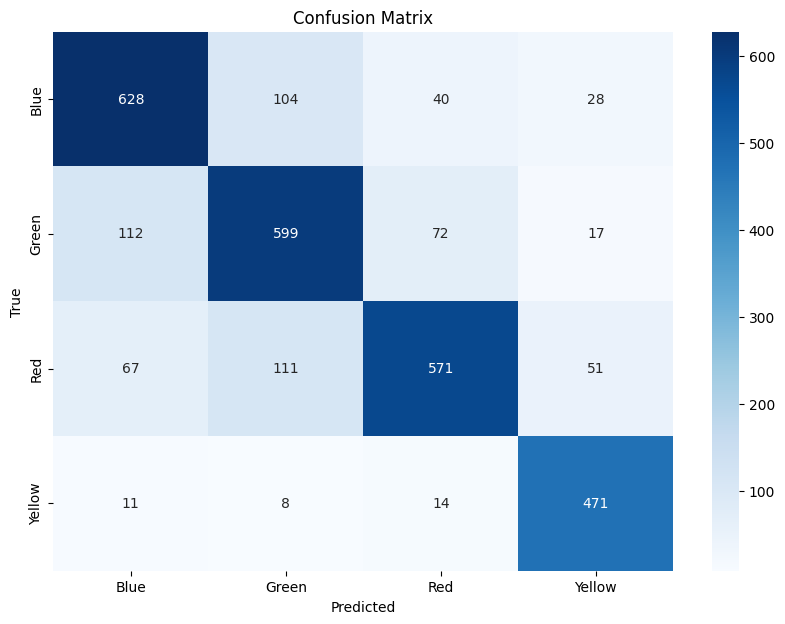


Classification Report:

              precision    recall  f1-score   support

        Blue       0.77      0.79      0.78       800
       Green       0.73      0.75      0.74       800
         Red       0.82      0.71      0.76       800
      Yellow       0.83      0.93      0.88       504

    accuracy                           0.78      2904
   macro avg       0.79      0.80      0.79      2904
weighted avg       0.78      0.78      0.78      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=32,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar5.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar5.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar5.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar5.save('/content/drive/My Drive/tugas_akhir/model_xception_var5_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar5.save('/content/drive/My Drive/tugas_akhir/model_xception_var5_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 6**

- Optimizer = SGD
- Batch Size = 64
- Learning Rate = 0,001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar6 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar6.compile(
    optimizer=SGD(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar6.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer_2[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │        512 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_24 (Add)        │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add_24[0][0]    

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


181/181 ━━━━━━━━━━━━━━━━━━━━ 893s 5s/step - accuracy: 0.2898 - loss: 1.5501
Epoch 2/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 6s 74us/step - accuracy: 0.3281 - loss: 1.3640 
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


181/181 ━━━━━━━━━━━━━━━━━━━━ 883s 5s/step - accuracy: 0.4436 - loss: 1.2407
Epoch 4/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 71us/step - accuracy: 0.5156 - loss: 1.0913 
Epoch 5/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 900s 5s/step - accuracy: 0.5498 - loss: 1.0792
Epoch 6/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 118us/step - accuracy: 0.6719 - loss: 0.9726
Epoch 7/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 902s 5s/step - accuracy: 0.6172 - loss: 0.9809
Epoch 8/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 75us/step - accuracy: 0.6875 - loss: 0.8672 
Epoch 9/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 882s 5s/step - accuracy: 0.6588 - loss: 0.9131
Epoch 10/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 71us/step - accuracy: 0.7188 - loss: 0.8305 
Training Time: 4527.13 seconds
45/45 ━━━━━━━━━━━━━━━━━━━━ 222s 5s/step - accuracy: 0.7162 - loss: 0.8505
Test Loss: 0.7879167199134827
Test Accuracy: 0.7378472089767456


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_272']
Received: inputs=Tensor(shape=(64, 128, 128, 3))
  warnings.warn(msg)


46/46 ━━━━━━━━━━━━━━━━━━━━ 225s 5s/step
Prediction Time: 226.03 seconds


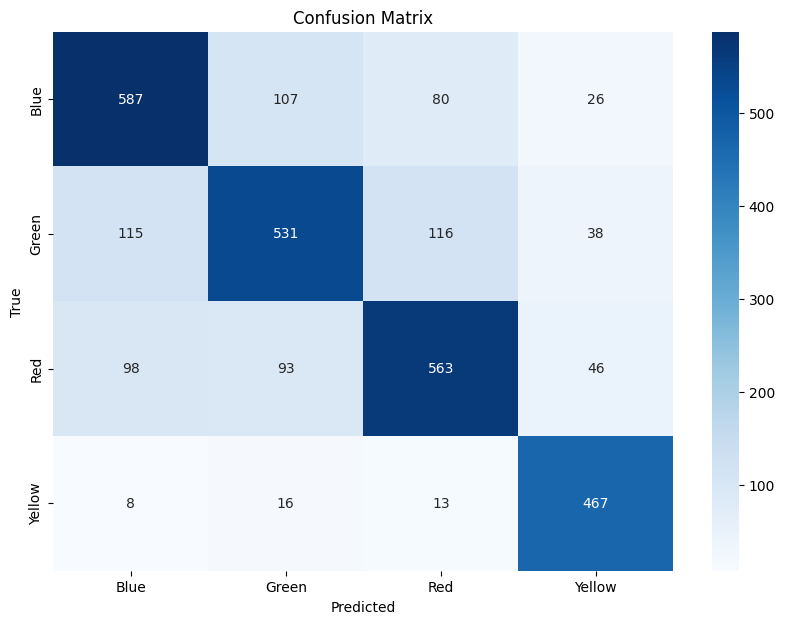


Classification Report:

              precision    recall  f1-score   support

        Blue       0.73      0.73      0.73       800
       Green       0.71      0.66      0.69       800
         Red       0.73      0.70      0.72       800
      Yellow       0.81      0.93      0.86       504

    accuracy                           0.74      2904
   macro avg       0.74      0.76      0.75      2904
weighted avg       0.74      0.74      0.74      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=64,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=64,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar6.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar6.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar6.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar6.save('/content/drive/My Drive/tugas_akhir/model_xception_var6_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar6.save('/content/drive/My Drive/tugas_akhir/model_xception_var6_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 7**

- Optimizer = SGD
- Batch Size = 32
- Learning Rate = 0,0001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar7 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar7.compile(
    optimizer=SGD(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar7.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer_3[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │        512 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_36 (Add)        │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add_36[0][0]    

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_408']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


363/363 ━━━━━━━━━━━━━━━━━━━━ 875s 2s/step - accuracy: 0.2648 - loss: 1.5867
Epoch 2/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 43us/step - accuracy: 0.1875 - loss: 1.6939 
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


363/363 ━━━━━━━━━━━━━━━━━━━━ 843s 2s/step - accuracy: 0.2934 - loss: 1.5057
Epoch 4/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 45us/step - accuracy: 0.2500 - loss: 1.4723 
Epoch 5/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 843s 2s/step - accuracy: 0.3330 - loss: 1.4279
Epoch 6/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 41us/step - accuracy: 0.4062 - loss: 1.3143 
Epoch 7/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 851s 2s/step - accuracy: 0.3630 - loss: 1.3733
Epoch 8/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 37us/step - accuracy: 0.3750 - loss: 1.3104 
Epoch 9/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 857s 2s/step - accuracy: 0.3919 - loss: 1.3226
Epoch 10/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 56us/step - accuracy: 0.3125 - loss: 1.4176 
Training Time: 4282.04 seconds
90/90 ━━━━━━━━━━━━━━━━━━━━ 211s 2s/step - accuracy: 0.4266 - loss: 1.2678
Test Loss: 1.1940977573394775
Test Accuracy: 0.5017361044883728


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_408']
Received: inputs=Tensor(shape=(32, 128, 128, 3))
  warnings.warn(msg)


91/91 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step
Prediction Time: 214.03 seconds


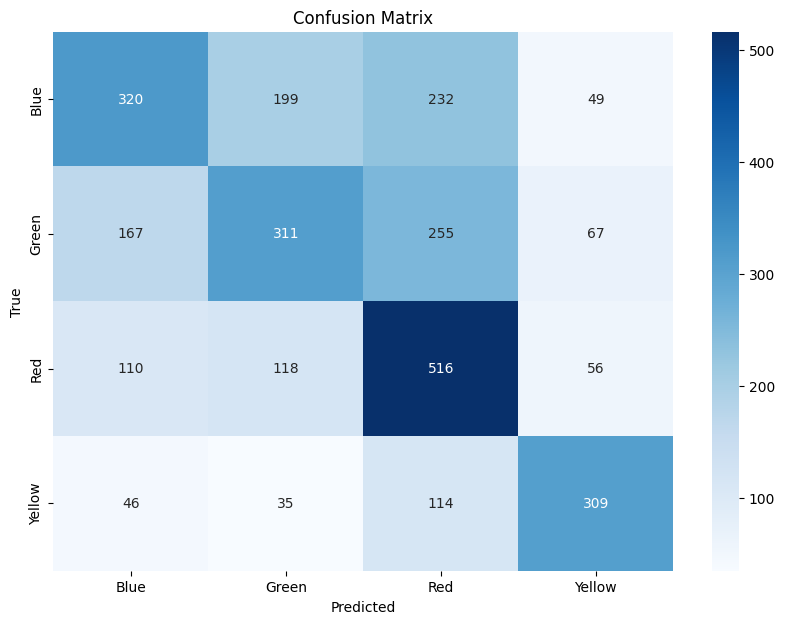


Classification Report:

              precision    recall  f1-score   support

        Blue       0.50      0.40      0.44       800
       Green       0.47      0.39      0.43       800
         Red       0.46      0.65      0.54       800
      Yellow       0.64      0.61      0.63       504

    accuracy                           0.50      2904
   macro avg       0.52      0.51      0.51      2904
weighted avg       0.51      0.50      0.50      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=32,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar7.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar7.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar7.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar7.save('/content/drive/My Drive/tugas_akhir/model_xception_var7_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar7.save('/content/drive/My Drive/tugas_akhir/model_xception_var7_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras


# **Xception Variasi 8**

- Optimizer = SGD
- Batch Size = 64
- Learning Rate = 0,0001

In [ ]:
# Direktori dataset Anda
train_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/train'
test_dir = '/content/drive/My Drive/tugas_akhir/dataset_fix82/test'

# Nama model
model_name = 'Dila_Xception'

# Dimensi input gambar
img_shape = (128, 128, 3)

# Jumlah kelas (misalnya, berdasarkan dataset Anda)
class_count = len(os.listdir(train_dir))

# Load arsitektur Xception tanpa top layer (include_top=False)
base_model = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=img_shape))

# Membekukan lapisan pada base model agar tidak dilatih ulang
base_model.trainable = False

# Menambahkan lapisan tambahan pada model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling untuk menurunkan dimensi
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout untuk mengurangi overfitting
output = Dense(class_count, activation='softmax')(x)  # Output layer

# Membuat model akhir
modelvar8 = Model(inputs=base_model.input, outputs=output)

# Kompilasi model
modelvar8.compile(
    optimizer=SGD(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan ringkasan model
modelvar8.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 63, 63,    │        864 │ input_layer[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 63, 63,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 63, 63,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 61, 61,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 61, 61,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 61, 61,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 61, 61,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 61, 61,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 61, 61,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 61, 61,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 61, 61,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 31, 31,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 31, 31,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 31, 31,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 31, 31,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 31, 31,    │          0 │ add[0][0]       

 Total params: 21,124,268 (80.58 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

Found 11628 images belonging to 4 classes.
Found 2904 images belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


181/181 ━━━━━━━━━━━━━━━━━━━━ 3697s 20s/step - accuracy: 0.2386 - loss: 1.6927
Epoch 2/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 18s 138us/step - accuracy: 0.1875 - loss: 1.6850
Epoch 3/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


181/181 ━━━━━━━━━━━━━━━━━━━━ 1020s 5s/step - accuracy: 0.2578 - loss: 1.5904
Epoch 4/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 6s 94us/step - accuracy: 0.2656 - loss: 1.5955 
Epoch 5/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 993s 5s/step - accuracy: 0.2658 - loss: 1.5454
Epoch 6/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 7s 87us/step - accuracy: 0.2188 - loss: 1.6337 
Epoch 7/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 982s 5s/step - accuracy: 0.2975 - loss: 1.5039
Epoch 8/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 117us/step - accuracy: 0.2188 - loss: 1.6622
Epoch 9/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 979s 5s/step - accuracy: 0.3141 - loss: 1.4424
Epoch 10/10
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 137us/step - accuracy: 0.3906 - loss: 1.3093
Training Time: 7870.39 seconds
45/45 ━━━━━━━━━━━━━━━━━━━━ 1055s 24s/step - accuracy: 0.2920 - loss: 1.3986
Test Loss: 1.3471332788467407
Test Accuracy: 0.3489583432674408


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(64, 128, 128, 3))
  warnings.warn(msg)


46/46 ━━━━━━━━━━━━━━━━━━━━ 247s 5s/step
Prediction Time: 247.25 seconds


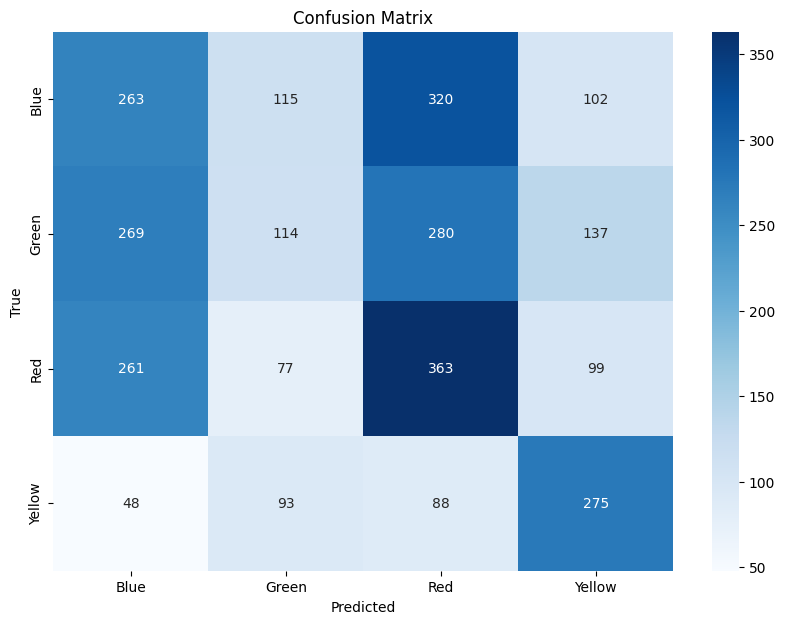


Classification Report:

              precision    recall  f1-score   support

        Blue       0.31      0.33      0.32       800
       Green       0.29      0.14      0.19       800
         Red       0.35      0.45      0.39       800
      Yellow       0.45      0.55      0.49       504

    accuracy                           0.35      2904
   macro avg       0.35      0.37      0.35      2904
weighted avg       0.34      0.35      0.33      2904



In [ ]:
# Mendefinisikan ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Membaca gambar dari direktori train dan membuat generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Ukuran gambar yang akan diubah
    batch_size=64,  # Ukuran batch
    class_mode='categorical'  # Label dalam format one-hot encoding
)

# Membaca gambar dari direktori test untuk evaluasi
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=64,
    class_mode='categorical',  # Label dalam format one-hot encoding
    shuffle=False  # Penting agar urutan data tetap konsisten
)

# Mengukur waktu pelatihan
start_train_time = time.time()

# Latih model menggunakan generator
history = modelvar8.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Langkah per epoch untuk pelatihan
    epochs=10  # Jumlah epoch
)

end_train_time = time.time()
training_time = end_train_time - start_train_time
print(f"Training Time: {training_time:.2f} seconds")

# Evaluasi model menggunakan test data
test_loss, test_acc = modelvar8.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Mengukur waktu prediksi
start_pred_time = time.time()

# Membuat prediksi pada seluruh test data
test_predictions = modelvar8.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1, verbose=1)

end_pred_time = time.time()
prediction_time = end_pred_time - start_pred_time
print(f"Prediction Time: {prediction_time:.2f} seconds")

# Mengambil label asli dari test data
true_labels = test_generator.classes

# Mengambil prediksi kelas yang memiliki probabilitas tertinggi
predicted_labels = np.argmax(test_predictions, axis=1)

# Menghitung confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Menampilkan confusion matrix sebagai heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan classification report
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("\nClassification Report:\n")
print(report)

In [ ]:
# Simpan model
modelvar8.save('/content/drive/My Drive/tugas_akhir/model_xception_var8_fix.h5')
print("Model berhasil disimpan dalam format .h5")

modelvar8.save('/content/drive/My Drive/tugas_akhir/model_xception_var8_fix.keras')
print("Model berhasil disimpan dalam format .keras")

Model berhasil disimpan dalam format .h5
Model berhasil disimpan dalam format .keras
